#**PROBLEMA DE NEGOCIO**


---




La importancia de reducir el riesgo crediticio ha llevado a una institución financiera alemana a buscar soluciones innovadoras. Como científicos de datos, hemos sido convocados para construir un modelo de machine learning preciso y confiable que sea capaz de evaluar con mayor precisión la probabilidad de incumplimiento crediticio de sus clientes.

#**1. Configuración del Ambiente**

Realizaremos la carga de las librerias a utilizar para el desarrollo dle proyecto

---




In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
pd.set_option('display.max_columns', None)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_auc_score, roc_curve
from imblearn.over_sampling import SMOTE
global df_banco, resultados, df_banco_eda, df_banco_clear, df_banco_norm
!pip install pycaret
from pycaret.classification import *

In [ ]:
!python -V
print('------')
!pip show Pandas | grep 'Name\|Version'
print('------')
!pip show Matplotlib | grep 'Name\|Version'
print('------')
!pip show seaborn | grep 'Name\|Version'
print('------')
!pip show pycaret | grep 'Name\|Version'
print('------')


#**2. Preprocesamiento de Datos**
Realizaremos análisis de los tipos de datos, duplicados, nulos, etc, y se realizarán transformaciones necesarias para obtener un set de datos de calidad, para el desarrollo de los modelos.

---


##*Pre-procesamiento de datos*
Se realizará la manipulación de los datos para su limpieza y transformación de dos maneras: una detallada que llamermos desarrollo de pre-procesamiento y otra resumiendo las mismas tareas en una función que llamaremos "procesar_datos", para ejecutarla en una sola vez cada vez que se quiera realizar este tratamiento a ésta base de datos.


##Desarrollo de pre-procesamiento

###Carga de base de datos, eliminar duplicados y verificación de datos nulos

In [ ]:
df_banco = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
df_banco.head()

,default,account_check_status,duration_in_month,credit_history,purpose,credit_amount,savings,present_emp_since,installment_as_income_perc,personal_status_sex,other_debtors,present_res_since,property,age,other_installment_plans,housing,credits_this_bank,job,people_under_maintenance,telephone,foreign_worker
0,0,< 0 DM,6,critical account/ other credits existing (not ...,domestic appliances,1169,unknown/ no savings account,.. >= 7 years,4,male : single,none,4,real estate,67,none,own,2,skilled employee / official,1,"yes, registered under the customers name",yes
1,1,0 <= ... < 200 DM,48,existing credits paid back duly till now,domestic appliances,5951,... < 100 DM,1 <= ... < 4 years,2,female : divorced/separated/married,none,2,real estate,22,none,own,1,skilled employee / official,1,none,yes
2,0,no checking account,12,critical account/ other credits existing (not ...,(vacation - does not exist?),2096,... < 100 DM,4 <= ... < 7 years,2,male : single,none,3,real estate,49,none,own,1,unskilled - resident,2,none,yes
3,0,< 0 DM,42,existing credits paid back duly till now,radio/television,7882,... < 100 DM,4 <= ... < 7 years,2,male : single,guarantor,4,if not A121 : building society savings agreeme...,45,none,for free,1,skilled employee / official,2,none,yes
4,1,< 0 DM,24,delay in paying off in the past,car (new),4870,... < 100 DM,1 <= ... < 4 years,3,male : single,none,4,unknown / no property,53,none,for free,2,skilled employee / official,2,none,yes


####Eliminado elementos duplicados

In [ ]:
df_banco= df_banco.drop_duplicates()

####Mostrando los datos nulos

In [ ]:
df_banco.isnull().sum()

default                       0
account_check_status          0
duration_in_month             0
credit_history                0
purpose                       0
credit_amount                 0
savings                       0
present_emp_since             0
installment_as_income_perc    0
personal_status_sex           0
other_debtors                 0
present_res_since             0
property                      0
age                           0
other_installment_plans       0
housing                       0
credits_this_bank             0
job                           0
people_under_maintenance      0
telephone                     0
foreign_worker                0
dtype: int64

In [ ]:
df_banco.info()


<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype 
---  ------                      --------------  ----- 
 0   default                     1000 non-null   int64 
 1   account_check_status        1000 non-null   object
 2   duration_in_month           1000 non-null   int64 
 3   credit_history              1000 non-null   object
 4   purpose                     1000 non-null   object
 5   credit_amount               1000 non-null   int64 
 6   savings                     1000 non-null   object
 7   present_emp_since           1000 non-null   object
 8   installment_as_income_perc  1000 non-null   int64 
 9   personal_status_sex         1000 non-null   object
 10  other_debtors               1000 non-null   object
 11  present_res_since           1000 non-null   int64 
 12  property                    1000 non-null   object
 13  age                         1000 non-null   int64

###Transformación de datos

####**account_check_status**(object) @ int

In [ ]:
df_banco['account_check_status'].unique()

array(['< 0 DM', '0 <= ... < 200 DM', 'no checking account',
       '>= 200 DM / salary assignments for at least 1 year'], dtype=object)

In [ ]:
a = { '< 0 DM': 1,
    '0 <= ... < 200 DM': 2,
    '>= 200 DM / salary assignments for at least 1 year': 3,
    'no checking account': 4
    }
df_banco['account_check_status'] = df_banco['account_check_status'].map(a).astype(int)


In [ ]:
df_banco.head()

####**credit_history** de object a int

In [ ]:
df_banco['credit_history'].unique()

In [ ]:
b = { 'no credits taken/ all credits paid back duly': 1,
    'all credits at this bank paid back duly': 2,
    'existing credits paid back duly till now': 3,
    'delay in paying off in the past': 4,
    'critical account/ other credits existing (not at this bank)' : 5
    }
df_banco['credit_history'] = df_banco['credit_history'].map(b).astype(int)

In [ ]:
df_banco.head()

####**purpose** de object a int

In [ ]:
df_banco['purpose'].value_counts()

In [ ]:
#purpose

c = { 'car (new)': 1,
    'car (used)': 2,
    'furniture/equipment': 3,
    'radio/television': 4,
    'domestic appliances' : 5,
     'repairs': 6,
    'education': 7,
    '(vacation - does not exist?)': 8,
    'retraining': 9,
    'business' : 10,
      'others':11,
    }
df_banco['purpose'] = df_banco['purpose'].map(c).astype(int)

####**savings** de object a int

In [ ]:
df_banco['savings'].value_counts()

... < 100 DM                   603
unknown/ no savings account    183
100 <= ... < 500 DM            103
500 <= ... < 1000 DM            63
.. >= 1000 DM                   48
Name: savings, dtype: int64

In [ ]:
print(df_banco['savings'].unique())

['unknown/ no savings account' '... < 100 DM' '500 <= ... < 1000 DM '
 '.. >= 1000 DM ' '100 <= ... < 500 DM']


In [ ]:
#*savings*

d = { 'unknown/ no savings account': 1,
    '.. >= 1000 DM ': 2,
    '500 <= ... < 1000 DM ': 3,
    '100 <= ... < 500 DM': 4,
    '... < 100 DM' : 5,
    }

df_banco['savings'] = df_banco['savings'].map(d).astype(int)

####**present_emp_since** de object a int

In [ ]:
print(df_banco['present_emp_since'].unique(), end='\n')

['.. >= 7 years' '1 <= ... < 4 years' '4 <= ... < 7 years' 'unemployed'
 '... < 1 year ']


In [ ]:
#*present_emp_since*

e = { '.. >= 7 years': 1,
    '4 <= ... < 7 years': 2,
    '1 <= ... < 4 years': 3,
    '... < 1 year ': 4,
    'unemployed' : 5,
    }

df_banco['present_emp_since'] = df_banco['present_emp_since'].map(e).astype(int)

####**personal_status_sex** de object a int

In [ ]:
print(df_banco['personal_status_sex'].unique())

['male : single' 'female : divorced/separated/married'
 'male : divorced/separated' 'male : married/widowed']


In [ ]:
#*personal_status_sex*

f = { 'male : divorced/separated': 1,
    'female : divorced/separated/married': 2,
    'male : single': 3,
    'male : married/widowed': 4,
    'female : single' : 5,
    }
df_banco['personal_status_sex'] = df_banco['personal_status_sex'].map(f).astype(int)

####**other_debtors** de object a int

In [ ]:
print(df_banco['other_debtors'].unique())

['none' 'guarantor' 'co-applicant']


In [ ]:
#*other_debtors*

g = { 'none': 1,
    'co-applicant': 2,
    'guarantor': 3,
    }

df_banco['other_debtors'] = df_banco['other_debtors'].map(g).astype(int)

####**property** de object a int

In [ ]:
print(df_banco['property'].unique())

['real estate'
 'if not A121 : building society savings agreement/ life insurance'
 'unknown / no property'
 'if not A121/A122 : car or other, not in attribute 6']


In [ ]:
#*property*

h = { 'real estate': 1,
    'if not A121 : building society savings agreement/ life insurance': 2,
     'if not A121/A122 : car or other, not in attribute 6': 3,
    'unknown / no property': 4,
    }
df_banco['property'] = df_banco['property'].map(h).astype(int)

####**other_installment_plans** de object a int

In [ ]:
print(df_banco['other_installment_plans'].unique())

['none' 'bank' 'stores']


In [ ]:
#*other_installment_plans*

i = { 'bank': 1,
    'stores': 2,
     'none': 3,
     }
df_banco['other_installment_plans'] = df_banco['other_installment_plans'].map(i).astype(int)

####**housing** de object a int

In [ ]:
print(df_banco['housing'].unique())

['own' 'for free' 'rent']


In [ ]:
#*housing*

j = { 'rent': 1,
    'own': 2,
     'for free': 3,
     }
df_banco['housing'] = df_banco['housing'].map(j).astype(int)

####**job** de object a int

In [ ]:
print(df_banco['job'].unique())

['skilled employee / official' 'unskilled - resident'
 'management/ self-employed/ highly qualified employee/ officer'
 'unemployed/ unskilled - non-resident']


In [ ]:
#*job*

k = { 'unemployed/ unskilled - non-resident': 1,
    'unskilled - resident': 2,
     'skilled employee / official': 3,
      'management/ self-employed/ highly qualified employee/ officer': 4,
     }
df_banco['job'] = df_banco['job'].map(k).astype(int)

####**telephone** de object a int

In [ ]:
print(df_banco['telephone'].unique())

['yes, registered under the customers name ' 'none']


In [ ]:
#*telephone*

l = { 'none': 0,
    'yes, registered under the customers name ': 1,
    }
df_banco['telephone'] = df_banco['telephone'].map(l).astype(int)

####**foreign_worker** de object a int

In [ ]:
print(df_banco['foreign_worker'].unique())

['yes' 'no']


In [ ]:
#*foreign_worker*

m = { 'no': 0,
    'yes': 1,
    }
df_banco['foreign_worker'] = df_banco['foreign_worker'].map(m).astype(int)

In [ ]:
df_banco.head()

In [ ]:
df_banco.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype
---  ------                      --------------  -----
 0   default                     1000 non-null   int64
 1   account_check_status        1000 non-null   int64
 2   duration_in_month           1000 non-null   int64
 3   credit_history              1000 non-null   int64
 4   purpose                     1000 non-null   int64
 5   credit_amount               1000 non-null   int64
 6   savings                     1000 non-null   int64
 7   present_emp_since           1000 non-null   int64
 8   installment_as_income_perc  1000 non-null   int64
 9   personal_status_sex         1000 non-null   int64
 10  other_debtors               1000 non-null   int64
 11  present_res_since           1000 non-null   int64
 12  property                    1000 non-null   int64
 13  age                         1000 non-null   int64
 14  other_ins

##**Función procesar_datos** para ejecución rápida

In [ ]:
###Tu función procesar_datos() y tu código aqui.
def procesar_datos():
  global df_banco, resultados
  df_banco = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
  df_banco.head()
    #Elimnando elementos duplicados
  df_banco.drop_duplicates()
    #Chequear existencia o no de datos nulos
  df_banco.isnull().sum()

    #Transformando la columna account_check_status
    #Creo un diccionario para sustituir los elementos de texto a valores numéricos
  a = { '< 0 DM': 1,
    '0 <= ... < 200 DM': 2,
    '>= 200 DM / salary assignments for at least 1 year': 3,
    'no checking account': 4
      }
    #Realizo la sustición con el método map y convierto a número entero con astype
  df_banco['account_check_status'] = df_banco['account_check_status'].map(a).astype(int)
##Aplico la misma metodología para todas las columnas de texto siguientes:
#*'credit_history'*
  b = { 'no credits taken/ all credits paid back duly': 1,
      'all credits at this bank paid back duly': 2,
      'existing credits paid back duly till now': 3,
       'delay in paying off in the past': 4,
      'critical account/ other credits existing (not at this bank)' : 5
       }
  df_banco['credit_history'] = df_banco['credit_history'].map(b).astype(int)

#*'purpose'*

  c = { 'car (new)': 1,
      'car (used)': 2,
      'furniture/equipment': 3,
      'radio/television': 4,
      'domestic appliances' : 5,
      'repairs': 6,
      'education': 7,
      '(vacation - does not exist?)': 8,
      'retraining': 9,
      'business' : 10,
        'others':11,
      }
  df_banco['purpose'] = df_banco['purpose'].map(c).astype(int)

#*savings*

  d = { 'unknown/ no savings account': 1,
      '.. >= 1000 DM ': 2,
      '500 <= ... < 1000 DM ': 3,
      '100 <= ... < 500 DM': 4,
      '... < 100 DM' : 5,
      }

  df_banco['savings'] = df_banco['savings'].map(d).astype(int)

#*present_emp_since*

  e = { '.. >= 7 years': 1,
      '4 <= ... < 7 years': 2,
      '1 <= ... < 4 years': 3,
      '... < 1 year ': 4,
      'unemployed' : 5,
      }

  df_banco['present_emp_since'] = df_banco['present_emp_since'].map(e).astype(int)

#*personal_status_sex*

  f = { 'male : divorced/separated': 1,
      'female : divorced/separated/married': 2,
      'male : single': 3,
      'male : married/widowed': 4,
      'female : single' : 5,
      }
  df_banco['personal_status_sex'] = df_banco['personal_status_sex'].map(f).astype(int)

#*other_debtors*

  g = { 'none': 1,
      'co-applicant': 2,
      'guarantor': 3,
      }

  df_banco['other_debtors'] = df_banco['other_debtors'].map(g).astype(int)

#*property*

  h = { 'real estate': 1,
      'if not A121 : building society savings agreement/ life insurance': 2,
      'if not A121/A122 : car or other, not in attribute 6': 3,
      'unknown / no property': 4,
      }
  df_banco['property'] = df_banco['property'].map(h).astype(int)

#*other_installment_plans*

  i = { 'bank': 1,
      'stores': 2,
      'none': 3,
      }
  df_banco['other_installment_plans'] = df_banco['other_installment_plans'].map(i).astype(int)

#*housing*

  j = { 'rent': 1,
      'own': 2,
      'for free': 3,
      }
  df_banco['housing'] = df_banco['housing'].map(j).astype(int)

#*job*

  k = { 'unemployed/ unskilled - non-resident': 1,
      'unskilled - resident': 2,
      'skilled employee / official': 3,
        'management/ self-employed/ highly qualified employee/ officer': 4,
      }
  df_banco['job'] = df_banco['job'].map(k).astype(int)

#*telephone*

  l = { 'none': 0,
      'yes, registered under the customers name ': 1,
      }
  df_banco['telephone'] = df_banco['telephone'].map(l).astype(int)

#*foreign_worker*

  m = { 'no': 0,
      'yes': 1,
      }
  df_banco['foreign_worker'] = df_banco['foreign_worker'].map(m).astype(int)

In [ ]:
procesar_datos()
df_banco.head()

In [ ]:
df_banco.info()

#**3. Exploración de Datos**

Visualizamos los datos y crearemos nuevas configuraciones que nos sirvan para nuestro análisis.
Crearemos dos maneras de realizar este tratamiento : de manera detallada por cada linea de çodigo y estarán dentro de "desarrollo del procedimiento featuring". La segunda manera es la creación de una función que contiene todo el código resumido para ejecutarlo en una sola vez: Función "feature_engineering"


###Creando nuevas variables

In [ ]:
variables_discretas = ['personal_status_sex', 'age', 'duration_in_month', 'credit_amount', 'default']
df_banco[variables_discretas].head()

,personal_status_sex,age,duration_in_month,credit_amount,default
0,3,67,6,1169,0
1,2,22,48,5951,1
2,3,49,12,2096,0
3,3,45,42,7882,0
4,3,53,24,4870,1


###Desarrollo del procedimiento de featuring

In [ ]:
df_banco.head()

In [ ]:
df_banco.info()

####*Creando variable "Sexo" para identificar sólo el género.

In [ ]:
#Creado nueva variable "sexo"
df_banco_original = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
df_banco['sexo'] = df_banco_original['personal_status_sex'].str.split(':').str[0].str.strip()
n = { 'male': 0,
'female': 1,
}
df_banco['sexo']=df_banco['sexo'].map(n).astype(int)

####*Creando nueva vartiable "estado_civil"

In [ ]:
# Crea una nueva variable llamada estado_civil a partir del atributo personal_status_sex conteniendo:
# 1 : Para los solteros y 0: Para todos los demás casos
df_banco_original = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
df_banco['estado_civil'] = df_banco_original['personal_status_sex'].str.split(':').str[1].str.strip()
n = { 'single': 1,
'female': 1,
}
df_banco['estado_civil']=df_banco['estado_civil'].apply(lambda x:1 if x=='single' else 0).astype(int)


####*Creando nueva vartiable "rango_edad" a partir de "age

In [ ]:
#Creando variable rango_edad a partir del atributo "age"
df_banco['rango_edad'] = pd.cut(x = df_banco['age'], bins=[18, 30, 40, 50, 60, 70, 80], labels = [1, 2, 3, 4, 5, 6]).astype(int)

####*Creando una nueva variable rango_plazos_credito* a partir del atributo duration_in_month

In [ ]:
#Creando variable rango_plazos_credito a partir del atributo "duration_in_month"
df_banco['rango_plazos_credito'] = pd.cut(x = df_banco['duration_in_month'], bins=[1, 12, 24, 36, 48, 60, 72], labels = [1, 2, 3, 4, 5, 6]).astype(int)

####*Creando una nueva variable rango_valor_credito a partir del atributo credit_amount*

In [ ]:
#Creando variable  rango_valor_credito a partir del atributo "credit_amount"
df_banco['rango_valor_credito'] = pd.cut(x = df_banco['credit_amount'],
                                         bins=[1, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000],
                                         labels =[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]).astype(int)

####*Eliminando las columnas que se usaron como base para la creación de las nuevas variables. *

In [ ]:
#Eliminando las columnas que se usaron como base para la creación de las nuevas variables.
df_banco.drop(['personal_status_sex','age','duration_in_month','credit_amount'],axis=1, inplace=True)

###**Función "feature_engineering()"** para ejecución rápida

In [ ]:
#Creación de la función que agrupa la definición y ejecución de nuevas variables
def feature_engineering():
    global df_banco, resultados
   #Elimnando elementos duplicados
    df_banco.drop_duplicates()
   #Chequear existencia o no de datos nulos
    df_banco.isnull().sum()

  # #Creado nueva variable "sexo" conteniendo male=0 y female=1
    df_banco_original = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
    df_banco['sexo'] = df_banco_original['personal_status_sex'].str.split(':').str[0].str.strip()
    n = { 'male': 0,
     'female': 1,
     }
    df_banco['sexo']=df_banco['sexo'].map(n).astype(int)


# Crea una nueva variable llamada "estado_civil" a partir del atributo personal_status_sex conteniendo 1 : Para los solteros y 0: Para todos los demás casos:

    df_banco_original = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv")
    df_banco['estado_civil'] = df_banco_original['personal_status_sex'].str.split(':').str[1].str.strip()
    n = { 'single': 1,
    'female': 1,
    }
    df_banco['estado_civil']=df_banco['estado_civil'].apply(lambda x:1 if x=='single' else 0).astype(int)


#Creando variable rango_edad a partir del atributo "age"
    df_banco['rango_edad'] = pd.cut(x = df_banco['age'], bins=[18, 30, 40, 50, 60, 70, 80], labels = [1, 2, 3, 4, 5, 6]).astype(int)


#Creando variable rango_plazos_credito a partir del atributo "duration_in_month"
    df_banco['rango_plazos_credito'] = pd.cut(x = df_banco['duration_in_month'], bins=[1, 12, 24, 36, 48, 60, 72], labels = [1, 2, 3, 4, 5, 6]).astype(int)


#Creando variable  rango_valor_credito a partir del atributo "credit_amount"
    df_banco['rango_valor_credito'] = pd.cut(x = df_banco['credit_amount'],bins=[1, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000, 11000, 12000, 13000, 14000, 15000, 16000, 17000, 18000, 19000, 20000], labels =[1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20]).astype(int)

#Eliminando las columnas que se usaron como base para la creación de las nuevas variables.
    df_banco.drop(['personal_status_sex','age','duration_in_month','credit_amount'],axis=1, inplace=True)

In [ ]:
feature_engineering()
df_banco.head()

In [ ]:
df_banco.info()

####*Guardando base de datos tratada como "banco_EDA"

In [ ]:
df_banco.to_csv('banco_EDA.csv')

##Desarrollo de la visualización/Análisis exploratorio
Se generan algunas gráficas de visualización del dataset para su análisis

####Histograma para los siguientes atributos:
'sexo'

'estado_civil'

'rango_plazos_credito'

'rango_edad'

'default'

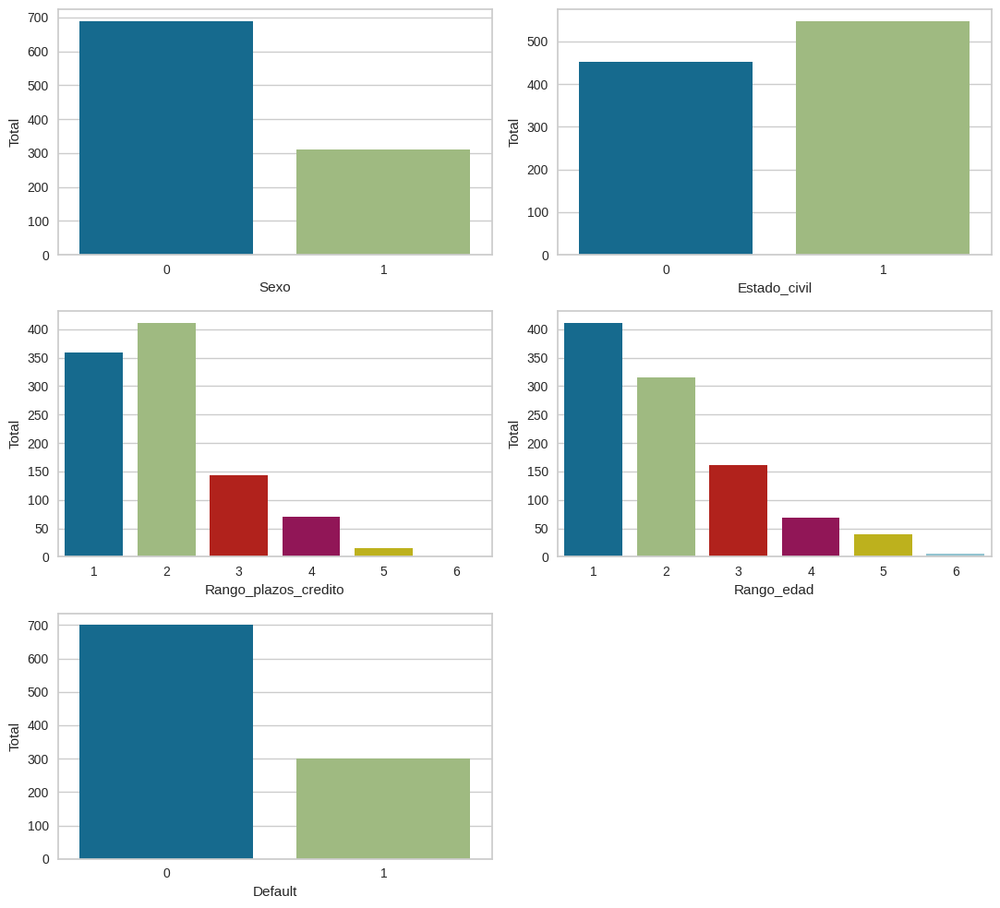

In [ ]:
columnas=['sexo','estado_civil','rango_plazos_credito','rango_edad','default']
plt.figure(figsize=(11, 10))
# Generar un gráfico por cada columna
for i, columna in enumerate(columnas,1):
    plt.subplot(3, 2, i)
    sns.countplot(x=columna, data=df_banco)
    plt.xlabel(columna.capitalize())
    plt.ylabel('Total')
plt.tight_layout()
plt.show()

####*Análisis exploratorio de los gráficos*

#####*Rango_plazos_credito*

In [ ]:
print(df_banco[df_banco['rango_plazos_credito']==6].shape[0])
print(df_banco[df_banco['rango_plazos_credito']==5].shape[0])

1
15


El rango de plazos de crédito fue clasificado segun la siguiente distribución, en donde observamos que hay un solo registro para el plazo entre 60 y 72 meses y 15 registros para el rango entre 48 y 60 meses. Para nuestro caso , descartamos los plazos iguales o mayores 4 años(48 meses) debido a que es un largo período influenciable por muchos factores que pueden incidir negativamente en el pgo a tiempo del prestamo. Son 16 registros que representan el 1,6% del universo en estudio.

*Duration in month*

1 :  1 <= ... < 12

2 : 12 <= ... < 24

3 : 24 <= ... < 36

4 : 36 <= ... < 48

5 : 48 <= ... < 60

6 : 60 <= ... < 72

#####*rango_edad*

In [ ]:
print(df_banco[df_banco['rango_edad']==6].shape[0])
print(df_banco[df_banco['rango_edad']==5].shape[0])

6
39


Entre 70 y 80 años tenemos 6 registros y entre 60 y 70 años son 39 personas. En total representan el 4,9% de la data total. Para este segmento de la población , debido a la edad, los créditos de manera preventiva no se otorgan a largo plazo ya que la expectativa de vida es reducida y aunque puedan ser pagadores solventes es un riesgo alto para la institución bancaria. Desestimamos este segmento para enfocarnos en un segmento adulto menor de 60 y mayor a 18 años.

Age in years

1 : 18 <= ... < 30

2 : 30 <= ... < 40

3 : 40 <= ... < 50

4 : 50 <= ... < 60

5 : 60 <= ... < 70

6 : 70 <= ... < 80


###Eliminando rangos sesgados

In [ ]:
# Crear nuevo dataframe df_banco  eliminando todas las filas donde 'rango_edad' y 'rango_plazos_credito' es igual a 5 y 6
df_banco = df_banco[(df_banco['rango_edad'] != 6) & (df_banco['rango_edad'] != 5)].reset_index(drop=True)
df_banco = df_banco[(df_banco['rango_plazos_credito'] != 6) & (df_banco['rango_plazos_credito'] != 5)].reset_index(drop=True)

###Eliminando columna "sexo"

In [ ]:
#Eliminamos la columna sexo del dataFrame
df_banco.drop(['sexo'], axis=1, inplace=True)
df_banco.info()

####Guardando base de datos con EDA y eliminando rangos no considerados en el análisis, con el nombre de "banco_clear.csv" 20 columnas y 941 filas

In [ ]:
df_banco.to_csv('banco_clear.csv')

In [ ]:
df_banco.info()

####Visualizando dataframe corregido

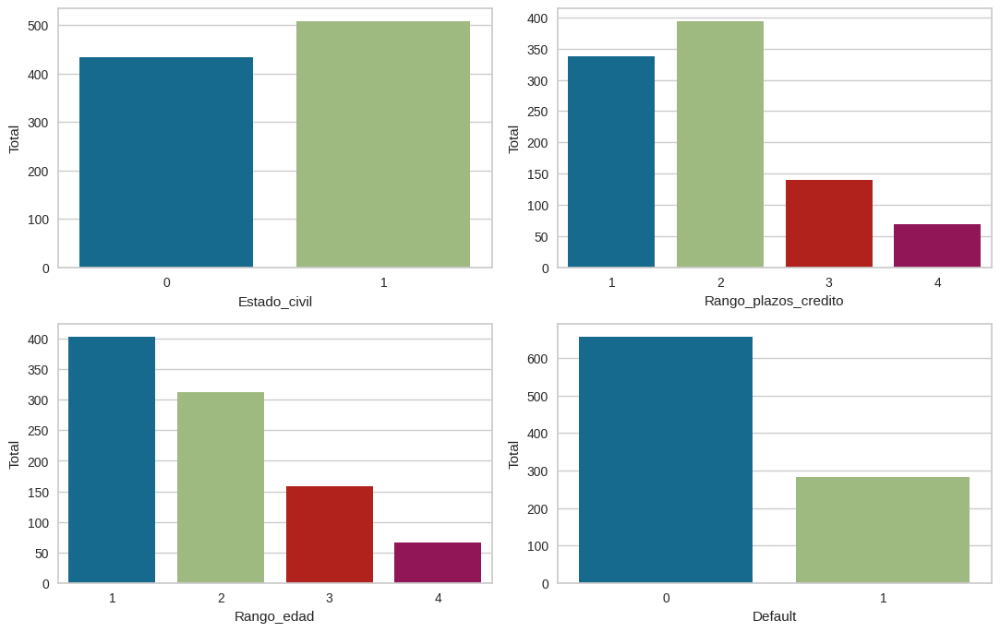

In [ ]:
columnas=['estado_civil','rango_plazos_credito','rango_edad','default']
plt.figure(figsize=(11, 10))
# Generar un gráfico por cada columna
for i, columna in enumerate(columnas,1):
    plt.subplot(3, 2, i)
    sns.countplot(x=columna, data=df_banco)
    plt.xlabel(columna.capitalize())
    plt.ylabel('Total')
plt.tight_layout()
plt.show()

##Función "analisis_exploratorio" para ejecución rápida
Con esta función podemos visualizar en un gráfico la relación entre estado civil, plazos de crédito, rango de edad y el target("default")

In [ ]:
#Tu función analisis_exploratorio() y tu código aqui
def analisis_exploratorio():
  global df_banco, resultados, df_banco_eda, df_banco_clear
  df_banco_eda = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_EDA.csv")
  df_banco_clear = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_clear.csv")
  df_banco_clear.drop(columns=['Unnamed: 0'],inplace=True)
#Visualizamos las columnas seleccionadas
  columnas=['estado_civil','rango_plazos_credito','rango_edad','default']
  plt.figure(figsize=(11, 10))
  # Generar un gráfico por cada columna
  for i, columna in enumerate(columnas,1):
      plt.subplot(3, 2, i)
      sns.countplot(x=columna, data=df_banco)
      plt.xlabel(columna.capitalize())
      plt.ylabel('Total')
  plt.tight_layout()
  plt.show()


##Visualizar analisis_exploratorio base de datos clear

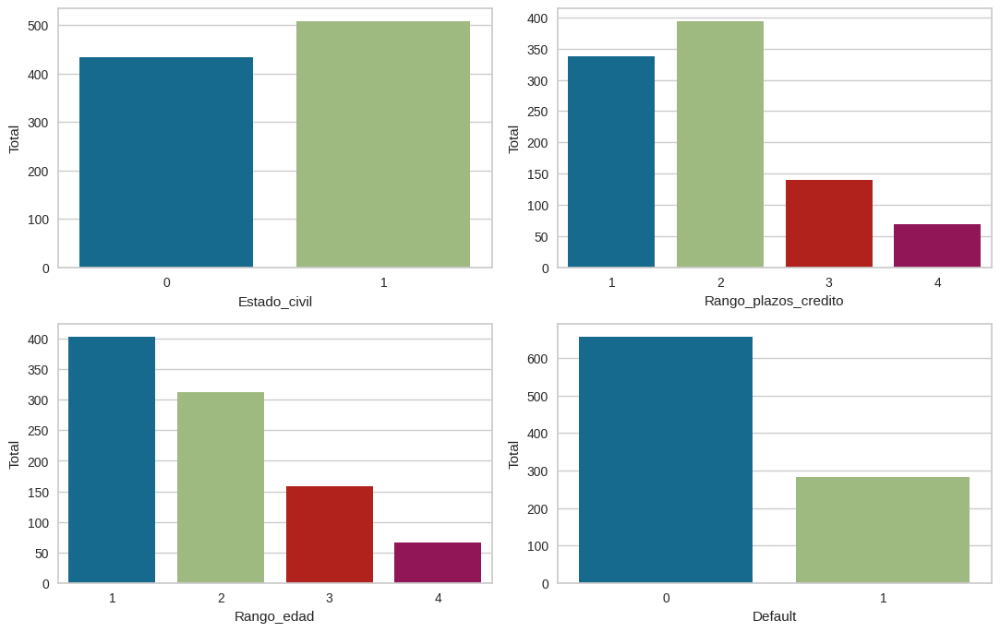

In [ ]:
analisis_exploratorio()

In [ ]:
df_banco_clear.info()

###Mapa de calor de correlaciones con dataset(clear)

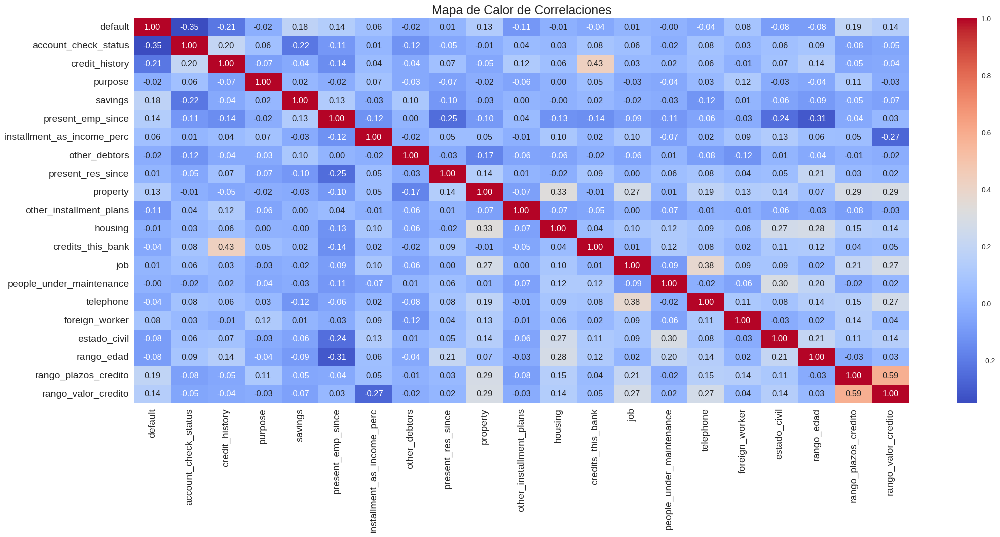

In [ ]:
plt.figure(figsize=(25, 10))
heatmap = sns.heatmap(df_banco_clear.corr(), annot=True, cmap='coolwarm', fmt=".2f")
heatmap.tick_params(axis='both', which='major', labelsize=14)
plt.title('Mapa de Calor de Correlaciones', fontsize=18)
plt.show()

#**4. Construcción de Modelos**
Haremos un recorrido por distintos modelos para evaluar su rendimiento.

---


##Ejecución con datos sin normalizar y desbalanceados
Los realiza la creación de modelos con los datos originales, los cuales están desbalanceados en función del target y no se realizó normalización o estandarización en esta parte.

In [ ]:
#Tu función crea_modelos() y tu código aqui
def crear_modelos_ini():
  global df_banco, resultados_ini, df_banco_eda, df_banco_clear
  df_banco_eda = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_EDA.csv")
  df_banco_clear = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_clear.csv")
  df_banco_clear.drop(columns=['Unnamed: 0'],inplace=True)
  df_banco = df_banco_clear.copy()

  y = df_banco['default']
  x = df_banco.drop(columns=['default'])
  train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.25, random_state = 42)
  #creamos listas vacías por cada metrica que vamos a utilizar
  nombre_modelo = ['Regresión Logistica','Árbol de Desición','Random Forest','Naive Bayes']
  accuracy = []
  precision = []
  recall = []
  f1_Score = []
  auc_roc=[]

  #Regresión Logística
  rl = LogisticRegression()
  rl.fit(train_x, train_y)
  predictions = rl.predict(test_x)
  #Metricas de evalución
  accuracy_rl = accuracy_score(test_y, predictions)
  precision_rl = precision_score(test_y, predictions)
  recall_rl = recall_score(test_y, predictions)
  f1_score_rl = f1_score(test_y, predictions)
  auc_roc_rl = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_rl)
  precision.append(precision_rl)
  recall.append(recall_rl)
  f1_Score.append(f1_score_rl)
  auc_roc.append(auc_roc_rl)

  #Arbol de desición
  ad = DecisionTreeClassifier(criterion='entropy', random_state=42, max_depth=20)
  ad.fit(train_x, train_y)
  predictions = ad.predict(test_x)
  #Metricas de evalución
  accuracy_ad = accuracy_score(test_y, predictions)
  precision_ad = precision_score(test_y, predictions)
  recall_ad = recall_score(test_y, predictions)
  f1_score_ad = f1_score(test_y, predictions)
  auc_roc_ad = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_ad)
  precision.append(precision_ad)
  recall.append(recall_ad)
  f1_Score.append(f1_score_ad)
  auc_roc.append(auc_roc_ad)

  #Arboles de Desicion- Random Forest
  rf = RandomForestClassifier(random_state=42,max_depth=20, n_estimators=1000)
  rf.fit(train_x, train_y)
  predictions = rf.predict(test_x)
  #Metricas de evalución
  accuracy_rf = accuracy_score(test_y, predictions)
  precision_rf = precision_score(test_y, predictions)
  recall_rf = recall_score(test_y, predictions)
  f1_score_rf = f1_score(test_y, predictions)
  auc_roc_rf = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_rf)
  precision.append(precision_rf)
  recall.append(recall_rf)
  f1_Score.append(f1_score_rf)
  auc_roc.append(auc_roc_rf)

  #Naive Bayes
  nb = GaussianNB()
  nb.fit(train_x, train_y)
  predictions = nb.predict(test_x)
  #Metricas de evalución
  accuracy_nb = accuracy_score(test_y, predictions)
  precision_nb = precision_score(test_y, predictions)
  recall_nb = recall_score(test_y, predictions)
  f1_score_nb = f1_score(test_y, predictions)
  auc_roc_nb = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_nb)
  precision.append(precision_nb)
  recall.append(recall_nb)
  f1_Score.append(f1_score_nb)
  auc_roc.append(auc_roc_nb)
  #Lo guardamos en un diccionario
  resultados_ini = {
    'Nombre_Modelo': nombre_modelo,
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1_Score': f1_Score,
    'AUC_ROC': auc_roc
  }

In [ ]:
crear_modelos_ini()
for i, model in enumerate(resultados_ini['Nombre_Modelo']):
    print(f"Modelo: {model}")
    print(f"Accuracy: {resultados_ini['Accuracy'][i]}")
    print(f"Precisión: {resultados_ini['Precision'][i]}")
    print(f"Recall: {resultados_ini['Recall'][i]}")
    print(f"F1-score: {resultados_ini['F1_Score'][i]}")
    print(f"AUC-ROC: {resultados_ini['AUC_ROC'][i]}\n")

Modelo: Regresión Logistica
Accuracy: 0.7584745762711864
Precisión: 0.625
Recall: 0.43478260869565216
F1-score: 0.5128205128205128
AUC-ROC: 0.6634990887789639

Modelo: Árbol de Desición
Accuracy: 0.6991525423728814
Precisión: 0.4852941176470588
Recall: 0.4782608695652174
F1-score: 0.48175182481751827
AUC-ROC: 0.634340015620932

Modelo: Random Forest
Accuracy: 0.7627118644067796
Precisión: 0.6756756756756757
Recall: 0.36231884057971014
F1-score: 0.4716981132075472
AUC-ROC: 0.6452312765772803

Modelo: Naive Bayes
Accuracy: 0.7584745762711864
Precisión: 0.5697674418604651
Recall: 0.7101449275362319
F1-score: 0.632258064516129
AUC-ROC: 0.7442940206543435



####Creando dataframe para visualizar métricas del modelo base
ESte cuadro resume las métricas de los modelos realizados con el data set original sin balancear y sin normalizar.

In [ ]:
df_metricas_modelo_ini = pd.DataFrame(resultados_ini).round(2).set_index('Nombre_Modelo')
print(df_metricas_modelo_ini.head())


                     Accuracy  Precision  Recall  F1_Score  AUC_ROC
Nombre_Modelo                                                      
Regresión Logistica      0.76       0.62    0.43      0.51     0.66
Árbol de Desición        0.70       0.49    0.48      0.48     0.63
Random Forest            0.76       0.68    0.36      0.47     0.65
Naive Bayes              0.76       0.57    0.71      0.63     0.74


##Ejecución con Datos balanceados y normalizados
Realizaremos la creación de modelos utilizando la técnica o método de balanceo SMOTE para nuestro análisis

### Crear Función para balancear datos.

In [ ]:
#crear la funcion balancear_datos ya que hay más registros de una clase con respecto de la otra en la variable default
def balancear_datos():
  from imblearn.over_sampling import SMOTE
  global df_banco, resultados, df_banco_eda, df_banco_clear, df_banco_balance
  df_banco_eda = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_EDA.csv")
  df_banco_clear = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_clear.csv")
  df_banco_clear.drop(columns=['Unnamed: 0'],inplace=True)

  df_banco = df_banco_clear.copy()

  #dividiendo los datos en características y target
  X = df_banco.drop('default', axis = 1)
  y = df_banco['default']
  #Aplicar técnica de sobremuestreo SMOTE
  smt = SMOTE(random_state=123)
  X, y = smt.fit_resample(X, y)

  #unión de los datos balanceados
  df_banco_balance = pd.concat([X, y], axis=1)
  #Contar los valores de ambas clases para verificar balanceo de la variable default
  print(df_banco_balance.default.value_counts())

In [ ]:
balancear_datos()

1    658
0    658
Name: default, dtype: int64


In [ ]:
df_banco_balance.head()

In [ ]:
df_banco_balance.info()

###Usamos la función de analisis exploratorioo oara visualizar el dataframe con los datos balanceados

In [ ]:
#Tu función analisis_exploratorio() para datos balanceados
def analisis_exploratorio(df):
  global df_banco, resultados, df_banco_eda, df_banco_clear, df_banco_balance
  df_banco_eda = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_EDA.csv")
  df_banco_clear = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_clear.csv")
  df_banco_clear.drop(columns=['Unnamed: 0'],inplace=True)
#Visualizamos las columnas seleccionadas
  columnas=['estado_civil','rango_plazos_credito','rango_edad','default']
  plt.figure(figsize=(11, 10))
  # Generar un gráfico por cada columna
  for i, columna in enumerate(columnas,1):
      plt.subplot(3, 2, i)
      sns.countplot(x=columna, data=df_banco_balance)
      plt.xlabel(columna.capitalize())
      plt.ylabel('Total')
  plt.tight_layout()
  plt.show()


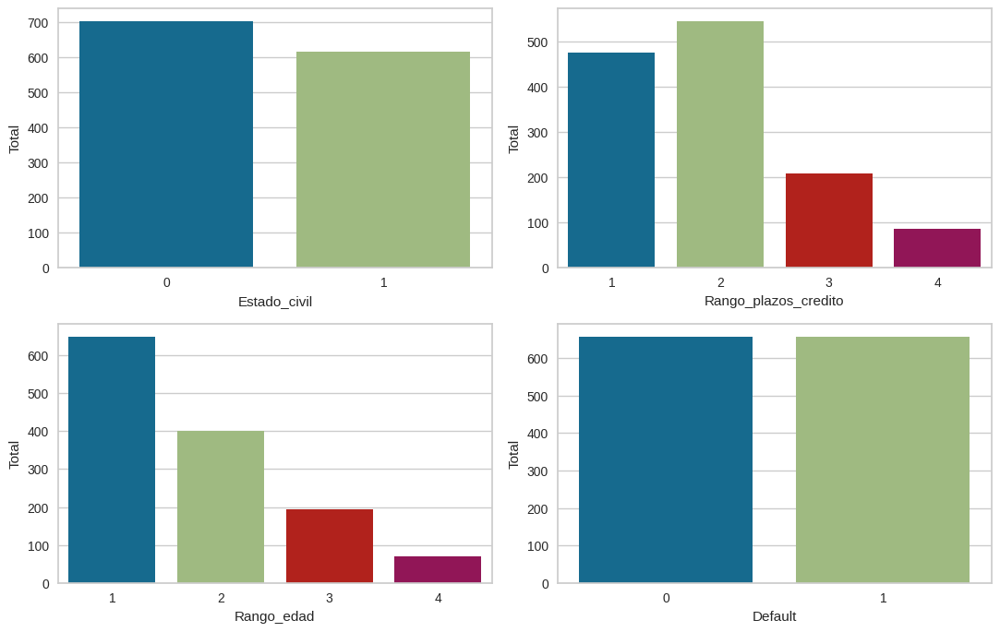

In [ ]:
analisis_exploratorio(df_banco_balance)

####Guardar dataframe balanceado

In [ ]:
df_banco_balance.to_csv('banco_balance.csv', index=False)

###Normalizar data y crear modelos
En esta parte vamos a normalizar los datos ya balanceados para luego crear los modelos

In [ ]:
#Tu función crea_modelos() y tu código aqui
def crear_modelos_norm():
  global df_banco, resultados_ini, resultados_norm, df_banco_eda, df_banco_clear, df_banco_norm
  df_banco_eda = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_EDA.csv")
  df_banco_balance = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_balance.csv")
  df_banco_norm = df_banco_balance.copy()
  y = df_banco_norm['default']
  x = df_banco_norm.drop(columns=['default'])

# **Normalizar los datos**
  from sklearn.preprocessing import MinMaxScaler
# Crear un objeto MinMaxScaler
  scaler = MinMaxScaler()
# Normaliza el DataFrame x (el parámetro "y"("default") está en rango 0-1 por lo tanto no será necesario)
  x_normalized = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
  x=x_normalized

# usamos la rutina train_test_split de Sklearn para dividir los datos en
# training y test (la variable random_state se usa para que siempre obtengamos la
# misma particion aleatoria)
  seed=42
  train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.25, random_state = seed)
  # ahora necesitamos partir train_x y train_y para sacarle el 10% que
  # # usaremos como validación
  X_train_val, X_val, y_train_val, y_val = train_test_split(train_x, train_y, test_size=0.1, random_state=seed)

  #Mostramos información detallada de las particiones del dataset

    # imprimimos por pantalla los tamaños finales
  print('=======================================================================================')
  print('PARTICIÓN DATASET:')
  print('')
  print('Instancias de Entrenamiento:')
  print('train_x: {}'.format(train_x.shape))
  print('train_y: {}'.format(train_y.shape))
  print(' ')
  print('Instancias de Prueba:')
  print('test_x: {}'.format(test_x.shape))
  print('test_y: {}'.format(test_y.shape))
  print(' ')
  print('Instancias de Validación:')
  print('X_val: {}'.format(X_val.shape))
  print('y_val: {}'.format(y_val.shape))
  print('=======================================================================================')

  #creamos listas vacías por cada metrica que vamos a utilizar
  nombre_modelo = ['Regresión Logistica','Árbol de Desición','Random Forest','Naive Bayes']
  accuracy = []
  precision = []
  recall = []
  f1_Score = []
  auc_roc=[]

  #Regresión Logística
  rl = LogisticRegression()
  rl.fit(train_x, train_y)
  predictions = rl.predict(test_x)
  #Metricas de evalución
  accuracy_rl = accuracy_score(test_y, predictions)
  precision_rl = precision_score(test_y, predictions)
  recall_rl = recall_score(test_y, predictions)
  f1_score_rl = f1_score(test_y, predictions)
  auc_roc_rl = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_rl)
  precision.append(precision_rl)
  recall.append(recall_rl)
  f1_Score.append(f1_score_rl)
  auc_roc.append(auc_roc_rl)

  #Arbol de desición
  ad = DecisionTreeClassifier(criterion='entropy', random_state=42, max_depth=20)
  ad.fit(train_x, train_y)
  predictions = ad.predict(test_x)
  #Metricas de evalución
  accuracy_ad = accuracy_score(test_y, predictions)
  precision_ad = precision_score(test_y, predictions)
  recall_ad = recall_score(test_y, predictions)
  f1_score_ad = f1_score(test_y, predictions)
  auc_roc_ad = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_ad)
  precision.append(precision_ad)
  recall.append(recall_ad)
  f1_Score.append(f1_score_ad)
  auc_roc.append(auc_roc_ad)

  #Arboles de Desicion- Random Forest
  rf = RandomForestClassifier(random_state=42,max_depth=20, n_estimators=1000)
  rf.fit(train_x, train_y)
  predictions = rf.predict(test_x)
  #Metricas de evalución
  accuracy_rf = accuracy_score(test_y, predictions)
  precision_rf = precision_score(test_y, predictions)
  recall_rf = recall_score(test_y, predictions)
  f1_score_rf = f1_score(test_y, predictions)
  auc_roc_rf = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_rf)
  precision.append(precision_rf)
  recall.append(recall_rf)
  f1_Score.append(f1_score_rf)
  auc_roc.append(auc_roc_rf)

  #Naive Bayes
  nb = GaussianNB()
  nb.fit(train_x, train_y)
  predictions = nb.predict(test_x)
  #Metricas de evalución
  accuracy_nb = accuracy_score(test_y, predictions)
  precision_nb = precision_score(test_y, predictions)
  recall_nb = recall_score(test_y, predictions)
  f1_score_nb = f1_score(test_y, predictions)
  auc_roc_nb = roc_auc_score(test_y, predictions)
  #Agregamos el valor de cada metrica a nuestra lista
  accuracy.append(accuracy_nb)
  precision.append(precision_nb)
  recall.append(recall_nb)
  f1_Score.append(f1_score_nb)
  auc_roc.append(auc_roc_nb)
  #Lo guardamos en un diccionario
  resultados_norm = {
    'Nombre_Modelo': nombre_modelo,
    'Accuracy': accuracy,
    'Precision': precision,
    'Recall': recall,
    'F1_Score': f1_Score,
    'AUC_ROC': auc_roc
  }


###Crear modelos normalizado

In [ ]:
crear_modelos_norm()
for i, model in enumerate(resultados_norm['Nombre_Modelo']):
    print(f"Modelo: {model}")
    print(f"Accuracy: {resultados_norm['Accuracy'][i]}")
    print(f"Precisión: {resultados_norm['Precision'][i]}")
    print(f"Recall: {resultados_norm['Recall'][i]}")
    print(f"F1-score: {resultados_norm['F1_Score'][i]}")
    print(f"AUC-ROC: {resultados_norm['AUC_ROC'][i]}\n")

PARTICIÓN DATASET:

Instancias de Entrenamiento:
train_x: (987, 20)
train_y: (987,)
 
Instancias de Prueba:
test_x: (329, 20)
test_y: (329,)
 
Instancias de Validación:
X_val: (99, 20)
y_val: (99,)
Modelo: Regresión Logistica
Accuracy: 0.7598784194528876
Precisión: 0.7083333333333334
Recall: 0.7986577181208053
F1-score: 0.750788643533123
AUC-ROC: 0.7632177479492916

Modelo: Árbol de Desición
Accuracy: 0.723404255319149
Precisión: 0.6726190476190477
Recall: 0.7583892617449665
F1-score: 0.7129337539432177
AUC-ROC: 0.7264168530947054

Modelo: Random Forest
Accuracy: 0.8054711246200608
Precisión: 0.7672955974842768
Recall: 0.8187919463087249
F1-score: 0.7922077922077921
AUC-ROC: 0.8066181953765846

Modelo: Naive Bayes
Accuracy: 0.7142857142857143
Precisión: 0.6608187134502924
Recall: 0.7583892617449665
F1-score: 0.7062499999999999
AUC-ROC: 0.7180835197613721



In [ ]:
df_banco_norm.head()

####Creando dataframe para visualizar métricas del modelo normalizado
Este es el cuadro resumen de las métricas con el data set normalizado

In [ ]:
df_metricas_modelo_norm = pd.DataFrame(resultados_norm).round(2).set_index('Nombre_Modelo')
print(df_metricas_modelo_norm.head())


                     Accuracy  Precision  Recall  F1_Score  AUC_ROC
Nombre_Modelo                                                      
Regresión Logistica      0.76       0.71    0.80      0.75     0.76
Árbol de Desición        0.72       0.67    0.76      0.71     0.73
Random Forest            0.81       0.77    0.82      0.79     0.81
Naive Bayes              0.71       0.66    0.76      0.71     0.72


#**5. Evaluación y Selección del Modelo**


---


##Modelos con datos sin balancear y sin normalizar

In [ ]:
def visualiza_resultados_ini():
  global df_banco, resultados, resultados_ini, resultados_norm
  results_df = pd.DataFrame(resultados_ini)
  results_df.set_index('Nombre_Modelo', inplace=True)
  #Gráfico
  results_df = results_df.T
  colors = ['#0077b6', '#CDDBF3','#9370DB', '#DDA0DD']
  results_df.plot(kind='bar', figsize=(15, 11), colormap='viridis', rot=0, color=colors)
  plt.title('Comparación de Métricas por Modelo')
  plt.xlabel('Métricas')
  plt.ylabel('Puntuación')
  plt.legend(title='Modelos')
  plt.tight_layout()
  plt.show()

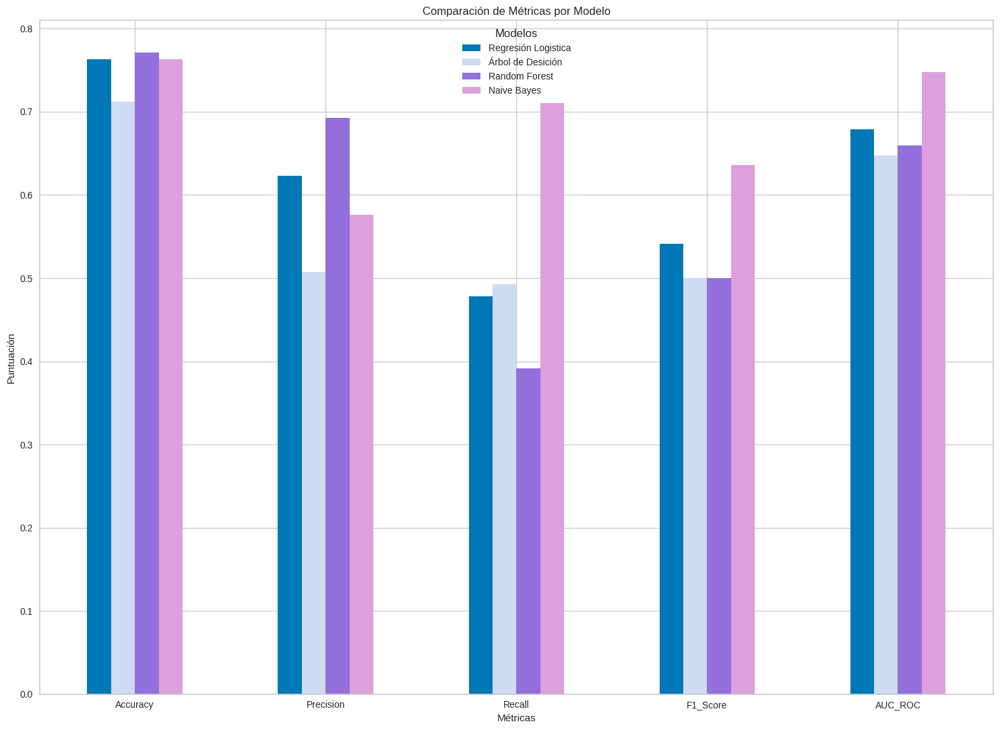

In [ ]:
visualiza_resultados_ini()

##Modelos con datos normalizados y balanceados

In [ ]:
def visualiza_resultados_norm():
  global df_banco, resultados, resultados_ini, resultados_norm
  results_df = pd.DataFrame(resultados_norm)
  results_df.set_index('Nombre_Modelo', inplace=True)
  #Gráfico
  results_df = results_df.T
  colors = ['#0077b6', '#CDDBF3','#9370DB', '#DDA0DD']
  results_df.plot(kind='bar', figsize=(15, 11), colormap='viridis', rot=0, color=colors)
  plt.title('Comparación de Métricas por Modelo')
  plt.xlabel('Métricas')
  plt.ylabel('Puntuación')
  #  plt.legend(title='Modelos', loc='right', bbox_to_anchor=(1.25, 0.5))
  plt.legend(title='Modelos', loc='right', bbox_to_anchor=(1.15, 0.8))
  plt.tight_layout()
  plt.show()

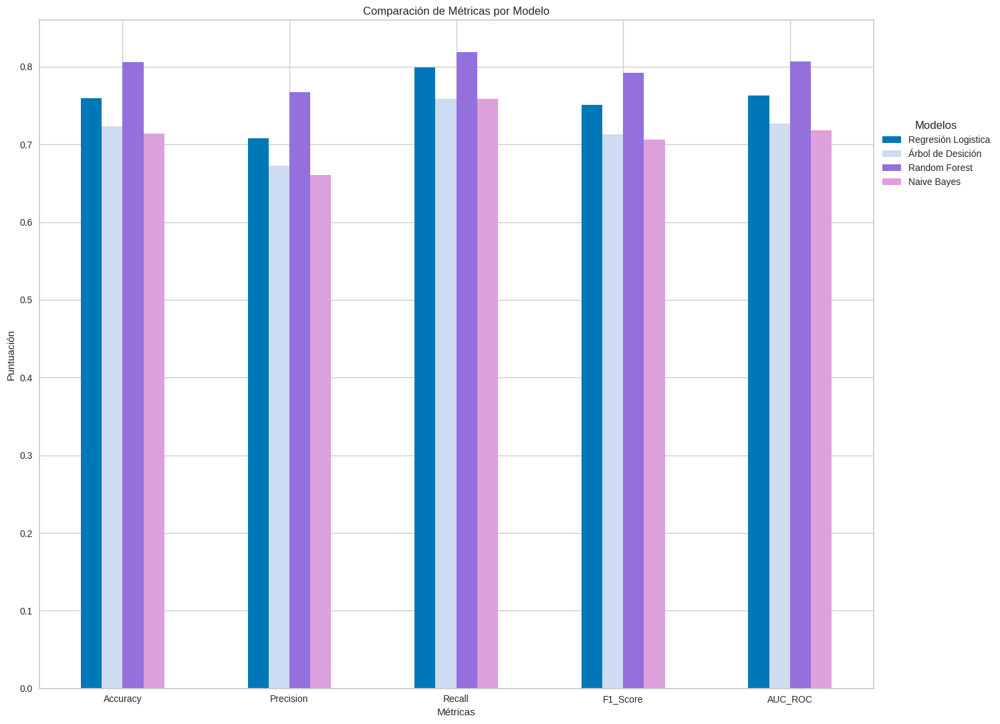

In [ ]:
visualiza_resultados_norm()

#**6. PYCARET**
En esta sección utilizaremos la herramienta PyCaret par realizar la evaluación de varios modelos en simultáneo y la elección del que obtenga mejores métricas.
---

##Usando Pycaret
Puedes leer las notas que estan denro de la función "dataPycaret".
Esta función realiza la carga de la base de datos balanceada y separa en dos dataframe uno con el target(y): "default" que será la variable dependiente y otro con todas las demas características en x. Normaliza los datos y luego separa los datos de entrenamiento para los modelos, asi como reserva un set de validación para utilizar una vez entrenado el modelo.

In [ ]:
def dataPycaret():
    global df_banco_norm, df_banco_balance, data_py, data_unseen
    df_banco_balance = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/banco_balance.csv")
    df_banco_norm = df_banco_balance.copy()
    y =df_banco_norm['default'].astype(int)
    x = df_banco_norm.drop(columns=['default'])

    # **Normalizar los datos**
    from sklearn.preprocessing import MinMaxScaler
    # Crear un objeto MinMaxScaler
    scaler = MinMaxScaler()
    # Normaliza el DataFrame x (el parámetro "y"("default") está en rango 0-1 por lo tanto no será necesario)
    x_normalized = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)
    x=x_normalized

    # usamos la rutina train_test_split de Sklearn para dividir los datos en
    # training y test (la variable random_state se usa para que siempre obtengamos la
    # misma particion aleatoria)
    seed=42
    train_x, test_x, train_y, test_y = train_test_split(x, y, test_size=0.25, random_state = seed)
    # ahora necesitamos partir train_x y train_y para sacarle el 10% que
    # # usaremos como validación
    X_train_val, X_val, y_train_val, y_val = train_test_split(train_x, train_y, test_size=0.1, random_state=seed)

    #Mostramos información detallada de las particiones del dataset

      # imprimimos por pantalla los tamaños finales
    print('=======================================================================================')
    print('PARTICIÓN DATASET:')
    print('')
    print('Instancias de Entrenamiento:')
    print('train_x: {}'.format(train_x.shape))
    print('train_y: {}'.format(train_y.shape))
    print(' ')
    print('Instancias de Prueba:')
    print('test_x: {}'.format(test_x.shape))
    print('test_y: {}'.format(test_y.shape))
    print(' ')
    print('Instancias de Validación:')
    print('X_val: {}'.format(X_val.shape))
    print('y_val: {}'.format(y_val.shape))
    print('=======================================================================================')
    # Data Set para entrenar en Pycaret:
    data_py = pd.concat([train_x,train_y], axis=1)
    #############################################################################
    ###  Creamos un Data Frame con los datos de Validacion para validar
    #############################################################################

    data_xval = pd.DataFrame(X_val, columns=x_normalized.columns)
    data_yval = pd.DataFrame(y_val)
    # Data Set para vaildación en Pycaret:
    data_unseen = pd.concat([data_xval,data_yval],axis=1)

###Utilizando la función creada con el nombre : dataPycaret, Obtenemos la partición del dataset de entrenamiento(data_py), prueba y validación(data_unseen).

In [ ]:
dataPycaret()

PARTICIÓN DATASET:

Instancias de Entrenamiento:
train_x: (987, 20)
train_y: (987,)
 
Instancias de Prueba:
test_x: (329, 20)
test_y: (329,)
 
Instancias de Validación:
X_val: (99, 20)
y_val: (99,)


In [ ]:
data_py.head()

,account_check_status,credit_history,purpose,savings,present_emp_since,installment_as_income_perc,other_debtors,present_res_since,property,other_installment_plans,...,credits_this_bank,job,people_under_maintenance,telephone,foreign_worker,estado_civil,rango_edad,rango_plazos_credito,rango_valor_credito,default
868,0.333333,0.5,0.000000,1.00,0.25,0.666667,0.0,1.000000,0.333333,1.0,...,0.000000,0.666667,1.0,1.0,1.0,1.0,0.000000,0.000000,0.111111,0
796,0.000000,0.5,0.444444,1.00,0.00,1.000000,0.0,1.000000,0.000000,0.5,...,0.000000,0.333333,0.0,0.0,1.0,1.0,1.000000,0.000000,0.000000,1
931,1.000000,1.0,0.777778,0.00,0.75,0.333333,0.0,0.000000,0.333333,1.0,...,0.333333,0.333333,1.0,0.0,1.0,1.0,0.333333,0.000000,0.166667,0
88,0.333333,0.5,0.000000,0.25,0.00,1.000000,0.0,1.000000,0.000000,1.0,...,0.000000,0.666667,0.0,1.0,1.0,1.0,1.000000,0.000000,0.055556,0
802,1.000000,0.5,0.000000,0.75,0.75,1.000000,0.0,0.666667,0.000000,1.0,...,0.000000,0.666667,0.0,1.0,1.0,0.0,0.333333,0.333333,0.055556,0


In [ ]:
data_py.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 987 entries, 868 to 1126
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   account_check_status        987 non-null    float64
 1   credit_history              987 non-null    float64
 2   purpose                     987 non-null    float64
 3   savings                     987 non-null    float64
 4   present_emp_since           987 non-null    float64
 5   installment_as_income_perc  987 non-null    float64
 6   other_debtors               987 non-null    float64
 7   present_res_since           987 non-null    float64
 8   property                    987 non-null    float64
 9   other_installment_plans     987 non-null    float64
 10  housing                     987 non-null    float64
 11  credits_this_bank           987 non-null    float64
 12  job                         987 non-null    float64
 13  people_under_maintenance    987 

In [ ]:
data_unseen.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 99 entries, 118 to 1238
Data columns (total 21 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   account_check_status        99 non-null     float64
 1   credit_history              99 non-null     float64
 2   purpose                     99 non-null     float64
 3   savings                     99 non-null     float64
 4   present_emp_since           99 non-null     float64
 5   installment_as_income_perc  99 non-null     float64
 6   other_debtors               99 non-null     float64
 7   present_res_since           99 non-null     float64
 8   property                    99 non-null     float64
 9   other_installment_plans     99 non-null     float64
 10  housing                     99 non-null     float64
 11  credits_this_bank           99 non-null     float64
 12  job                         99 non-null     float64
 13  people_under_maintenance    99 no

###Se realiza el setup de los parámetros de Pycaret con el algoritmo de clasificación

In [ ]:
from pycaret.classification import *
clasificacion = setup(data = data_py,
target = 'default',
session_id = 8644,
normalize = True,
transformation = True,
pca = True,
pca_components = 0.84,
remove_multicollinearity = True,
multicollinearity_threshold = 0.8,
remove_outliers = True,
imputation_type = 'simple',
numeric_imputation = 'median')
#3827
#8644

,Description,Value
0,Session id,8644
1,Target,default
2,Target type,Binary
3,Original data shape,"(987, 21)"
4,Transformed data shape,"(952, 15)"
5,Transformed train set shape,"(655, 15)"
6,Transformed test set shape,"(297, 15)"
7,Numeric features,20
8,Preprocess,True
9,Imputation type,simple


###Guardando modelos con mejor métricas
Se guarda un objeto con la comparación de modelos en donde los ordene por la mejor medida "F1" score y con n_select=4 guardará los 4 modelos que obtuvieron el mejor rendimiento de F1 score, aproximando el número a 4 decimales.
Luego visualizamos el best_model y nos entrega los parámetros de los cuatro primeros modelos.

In [ ]:
best_model = compare_models(
sort ='F1',
n_select = 4,
round=4,
)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
rf,Random Forest Classifier,0.8058,0.8623,0.8202,0.8064,0.8119,0.6111,0.6136,0.7120
nb,Naive Bayes,0.7884,0.8436,0.8169,0.7835,0.7985,0.5757,0.5786,0.3920
lightgbm,Light Gradient Boosting Machine,0.7855,0.8492,0.8143,0.7814,0.7964,0.5698,0.5724,0.6550
ridge,Ridge Classifier,0.7855,0.0000,0.8142,0.7805,0.7953,0.5700,0.5735,0.4090
lda,Linear Discriminant Analysis,0.7855,0.8543,0.8142,0.7805,0.7953,0.5700,0.5735,0.4370
lr,Logistic Regression,0.7870,0.8539,0.8058,0.7875,0.7948,0.5732,0.5762,0.4960
gbc,Gradient Boosting Classifier,0.7841,0.8511,0.8058,0.7831,0.7926,0.5671,0.5703,0.9190
et,Extra Trees Classifier,0.7870,0.8651,0.7918,0.7963,0.7922,0.5735,0.5764,0.5870
xgboost,Extreme Gradient Boosting,0.7826,0.8484,0.8002,0.7856,0.7911,0.5642,0.5673,0.8500
knn,K Neighbors Classifier,0.7580,0.8266,0.8060,0.7513,0.7750,0.5138,0.5198,0.5820


Processing:   0%|          | 0/68 [00:00<?, ?it/s]

In [ ]:
print(best_model)

[RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=8644, verbose=0, warm_start=False), GaussianNB(priors=None, var_smoothing=1e-09), LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.1, max_depth=-1,
               min_child_samples=20, min_child_weight=0.001, min_split_gain=0.0,
               n_estimators=100, n_jobs=-1, num_leaves=31, objective=None,
               random_state=8644, reg_alpha=0.0, reg_lambda=0.0, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0), RidgeCla

###*Seleccionando modelo Random Forest*
El modelo Random Forest fue el primero de los 4 solicitados con mejor F1 score y es el que utilizaremos para crearlo y utilizarlo para la clasificación


##Creando Modelo Random Forest con pycaret

Con esta línea de código se crea el modelo seleccionado utilizando las siglas que indica en la tabla inicial de comparación de todos los modelos entrenados.

In [ ]:
model_rf = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7971,0.8481,0.8611,0.7750,0.8158,0.5914,0.5954
1,0.7536,0.8468,0.6944,0.8065,0.7463,0.5094,0.5148
2,0.8986,0.9663,0.9722,0.8537,0.9091,0.7954,0.8041
3,0.7826,0.8375,0.8056,0.7838,0.7945,0.5638,0.5641
4,0.7536,0.8384,0.7500,0.7714,0.7606,0.5069,0.5071
5,0.8696,0.9242,0.8611,0.8857,0.8732,0.7390,0.7393
6,0.8551,0.9181,0.9143,0.8205,0.8649,0.7096,0.7144
7,0.7246,0.7958,0.7429,0.7222,0.7324,0.4489,0.4491
8,0.8551,0.8697,0.8571,0.8571,0.8571,0.7101,0.7101


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

###Evaluando Modelo RF
Se utiliza este comando para evaluar el modelo con Pycaret

In [ ]:
# Evaluate model:
evaluate_model(model_rf)

,Parameters
bootstrap,True
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,sqrt
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1


###Visualizar parámetros del modelo RF
Se pueden ver los prámetros de entrenamiento del modleo random forest y se puede ajustar si fuese necesario

In [ ]:
print(model_rf)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=8644, verbose=0, warm_start=False)


###Matriz de confusión
Se puede imprimir la matriz de confusión e incluso otras gráficas relacionadas con el modelo

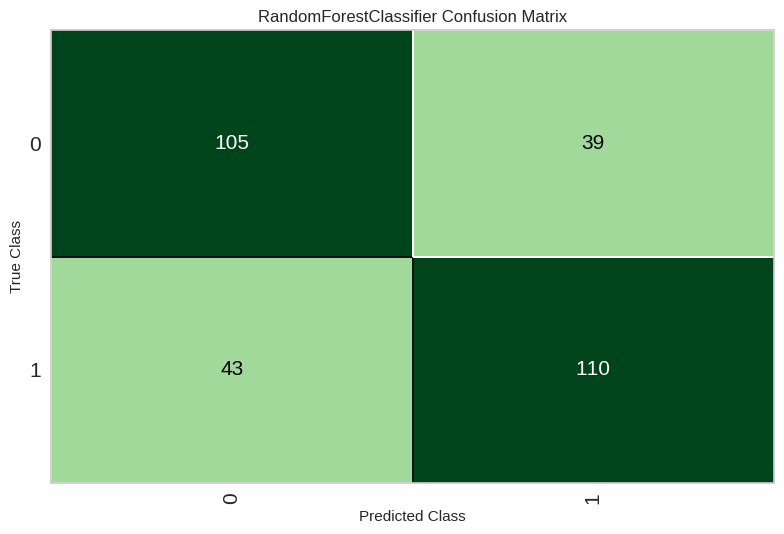

In [ ]:
plot_model(model_rf, plot='confusion_matrix')

**Análisis de métricas de desempeño del Modelo de clasificación**
---
El modelo tiene una excelente capacidad para distinguir entre las clases positiva y negativa, y tiene un buen equilibrio entre la precisión y el recall. La tasa de falsos positivos es moderadamente alta, lo que indica que se podrían considerar ajustes adicionales para mejorar el rendimiento del modelo en la clasificación de los solicitantes de crédito
---

###Ajuste de hiperparámetros
Se utiliza esta linea de código para poder ajustar los hiperparámetros usando algoritmos de ajustes internos en pycaret, gridsearch, etc. Puedes indicar que prioridad tiene alguna mpetrica a la hora de ajustar. En nuestro caso se priorizó el área bajo la curva; sin embargo no hubo una mejora considerable con esta herramienta.

In [ ]:
tune_model_rf = tune_model(model_rf, optimize='AUC')
print(tune_model_rf)
#no se generó una mejora en el modelo ajutado con hiperparámateros segun estos resultados

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7536,0.8148,0.8056,0.7436,0.7733,0.5044,0.5064
1,0.7391,0.8375,0.6944,0.7812,0.7353,0.4799,0.4831
2,0.8261,0.9461,0.9444,0.7727,0.8500,0.6480,0.6666
3,0.7391,0.8064,0.8056,0.7250,0.7632,0.4746,0.4779
4,0.8551,0.8721,0.7778,0.9333,0.8485,0.7118,0.7227
5,0.8986,0.9285,0.9167,0.8919,0.9041,0.7965,0.7968
6,0.8406,0.9151,0.8857,0.8158,0.8493,0.6807,0.6833
7,0.6812,0.7748,0.6571,0.6970,0.6765,0.3627,0.3633
8,0.8551,0.8403,0.8000,0.9032,0.8485,0.7106,0.7154


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).
RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       n_estimators=100, n_jobs=-1, oob_score=False,
                       random_state=8644, verbose=0, warm_start=False)


In [ ]:
evaluate_model(tune_model_rf)

,Parameters
bootstrap,True
ccp_alpha,0.0
class_weight,None
criterion,gini
max_depth,None
max_features,sqrt
max_leaf_nodes,None
max_samples,None
min_impurity_decrease,0.0
min_samples_leaf,1


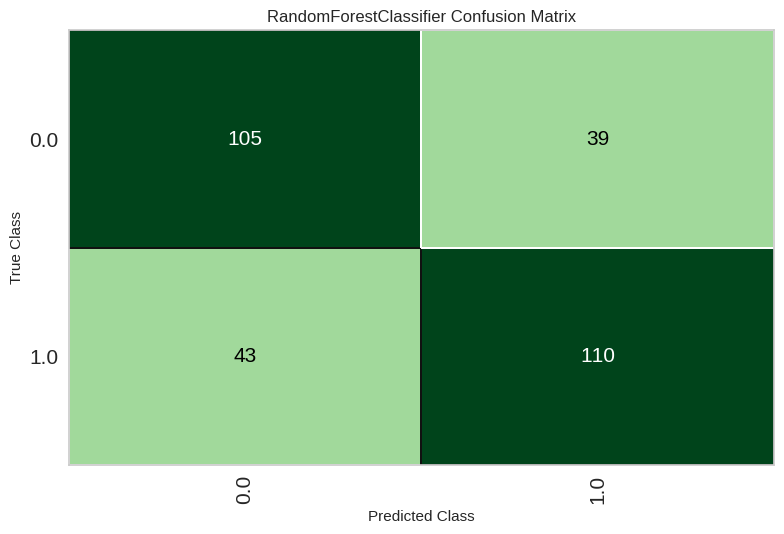

In [ ]:
plot_model(tune_model_rf, plot='confusion_matrix')

Es posible que las métricas de la matriz de confusión generadas por Pycaret no sean exactamente iguales a las métricas generadas por el modelo generado con compare model debido a varias razones. Una posible razón es que Pycaret utiliza una validación cruzada estratificada para evaluar el rendimiento del modelo, mientras que compare model utiliza una validación cruzada simple. La validación cruzada estratificada es una técnica de validación cruzada que asegura que cada pliegue de la validación cruzada tenga una distribución de clases similar a la distribución de clases en el conjunto de datos original. Esto puede resultar en métricas ligeramente diferentes en comparación con una validación cruzada simple.

Otra posible razón es que Pycaret utiliza un conjunto de métricas de evaluación ligeramente diferente en comparación con compare model. Pycaret proporciona una variedad de métricas de evaluación para evaluar el rendimiento del modelo, mientras que compare model utiliza un conjunto de métricas de evaluación predeterminado. Es posible que las métricas de evaluación utilizadas por Pycaret y compare model no sean exactamente iguales, lo que puede resultar en métricas ligeramente diferentes.

###**Modelo predictivo en Pycaret**
---
Se utiliza predict_model para realizar las pedicciones. Aqui se genera la predicción del modelo y podemos realizar las comparaciones de los valores reales versus la predicción y sus métricas correspondientes.
---
En la predicción del modelo con los datos de prueba se logró un resultado similar en cuanto al performance descrito en el análisis de métricas con los datos de entrenamiento.
---


In [ ]:
predict_model(model_rf)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.7239,0.8033,0.7190,0.7383,0.7285,0.4478,0.4479


,account_check_status,credit_history,purpose,savings,present_emp_since,installment_as_income_perc,other_debtors,present_res_since,property,other_installment_plans,...,people_under_maintenance,telephone,foreign_worker,estado_civil,rango_edad,rango_plazos_credito,rango_valor_credito,default,prediction_label,prediction_score
573,0.333333,0.50,0.444444,0.75,0.50,1.000000,0.5,1.000000,1.000000,1.0,...,0.0,0.0,1.0,0.0,0.666667,0.666667,0.111111,1,0,0.67
472,0.666667,0.50,0.444444,0.75,0.00,0.333333,0.0,1.000000,0.000000,1.0,...,0.0,0.0,1.0,0.0,0.666667,0.000000,0.055556,0,0,0.75
713,0.000000,1.00,0.000000,1.00,0.00,1.000000,0.0,0.666667,0.333333,1.0,...,0.0,0.0,1.0,1.0,0.333333,0.000000,0.000000,1,0,0.79
935,1.000000,0.50,0.000000,0.00,0.00,1.000000,0.0,0.666667,0.666667,1.0,...,0.0,1.0,1.0,1.0,0.666667,0.000000,0.111111,0,0,0.83
299,0.000000,0.75,0.333333,1.00,0.00,0.000000,0.0,1.000000,0.333333,1.0,...,0.0,0.0,1.0,0.0,0.000000,0.333333,0.166667,0,0,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
744,0.666667,0.50,0.333333,1.00,0.00,0.666667,0.0,1.000000,1.000000,1.0,...,0.0,0.0,1.0,0.0,1.000000,0.333333,0.111111,0,0,0.60
853,0.333333,0.50,0.777778,0.00,0.50,0.333333,0.0,0.333333,0.666667,1.0,...,0.0,0.0,1.0,0.0,0.000000,0.666667,0.166667,0,1,0.63
1188,0.000000,0.50,0.000000,1.00,0.25,0.666667,0.0,0.666667,0.666667,1.0,...,0.0,0.0,1.0,1.0,0.333333,0.666667,0.166667,1,1,0.92
194,1.000000,0.50,0.111111,0.25,0.25,0.666667,0.0,0.333333,0.333333,1.0,...,0.0,0.0,0.0,1.0,1.000000,0.000000,0.055556,0,0,0.66


###pycaret VALIDACIÓN(data_unseen)

In [ ]:
# **Se carga un nuevo conjunto de datos
# Finalmente, se utilizan las funciones predict_model() con el modelo previamente entrenado y data="dataframe nuevo" para hacer predicciones en el nuevo conjunto de datos.
unseen_predictions = predict_model(model_rf, data=data_unseen)
unseen_predictions.head()
# # Hacer Predicciones:
# final_pred = predict_model(model_rf, data=data_unseen)
# final_pred.head()
# obtener métricas
metricas = get_metrics()


,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Random Forest Classifier,0.8687,0.9590,0.9459,0.7609,0.8434,0.7326,0.7455


**Calificación del cliente**
---
La calificación del cliente implica asignar una puntuación basada en el riesgo crediticio. Factores como el historial de pago, la deuda total y la estabilidad financiera son considerados. Una calificación precisa es esencial.
---
Con el modelo Random Forest definido, probamos su precisión con los datos de validación , los cuales no fueron vistos por el modelo en la fase de entrenamiento.
---

Las métricas indican que el modelo tiene un excelente rendimiento en la clasificación de los solicitantes de crédito. En una visión general, este modelo es apto para utilizar en la institución bancaria(nuestro cliente).
---
Adicionalmente es pertinente indicar que con los resultados de este modelo y con un equipo multidisciplinario que considere lo mejor para el cumplimiento de las metas del banco, se tomará la decisión de usar el modelo y aplicarlo a un área del negocio o pueden tener otras opciones como: re entrenarlo con más datos,  sesgarlo a una muestra más específica o tomar otro modelo que genere otras métricas más convenientes.
---

#Bonus

##Utilización de la IA para el análisis

###Uso de IA para visualización: "Autoviz"

In [ ]:
#instalación de paquete

!pip install autoviz


Shape of your Data Set loaded: (1000, 21)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    Number of Numeric Columns =  0
    Number of Integer-Categorical Columns =  6
    Number of String-Categorical Columns =  11
    Number of Factor-Categorical Columns =  0
    Number of String-Boolean Columns =  2
    Number of Numeric-Boolean Columns =  2
    Number of Discrete String Columns =  0
    Number of NLP String Columns =  0
    Number of Date Time Columns =  0
    Number of ID Columns =  0
    Number of Columns to Delete =  0
    21 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix these data quality issues in the dataset, import FixDQ from autoviz...
    All variab

,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
default,int64,0.000000,0,0.000000,1.000000,No issue
account_check_status,object,0.000000,0,,,No issue
duration_in_month,int64,0.000000,3,4.000000,72.000000,Column has 70 outliers greater than upper bound (42.00) or lower than lower bound(-6.00). Cap them or remove them.
credit_history,object,0.000000,0,,,No issue
purpose,object,0.000000,1,,,1 rare categories: ['retraining']. Group them into a single category or drop the categories.
credit_amount,int64,0.000000,92,250.000000,18424.000000,Column has 72 outliers greater than upper bound (7882.38) or lower than lower bound(-2544.62). Cap them or remove them.
savings,object,0.000000,0,,,No issue
present_emp_since,object,0.000000,0,,,No issue
installment_as_income_perc,int64,0.000000,0,1.000000,4.000000,No issue
personal_status_sex,object,0.000000,0,,,No issue


Number of All Scatter Plots = 21


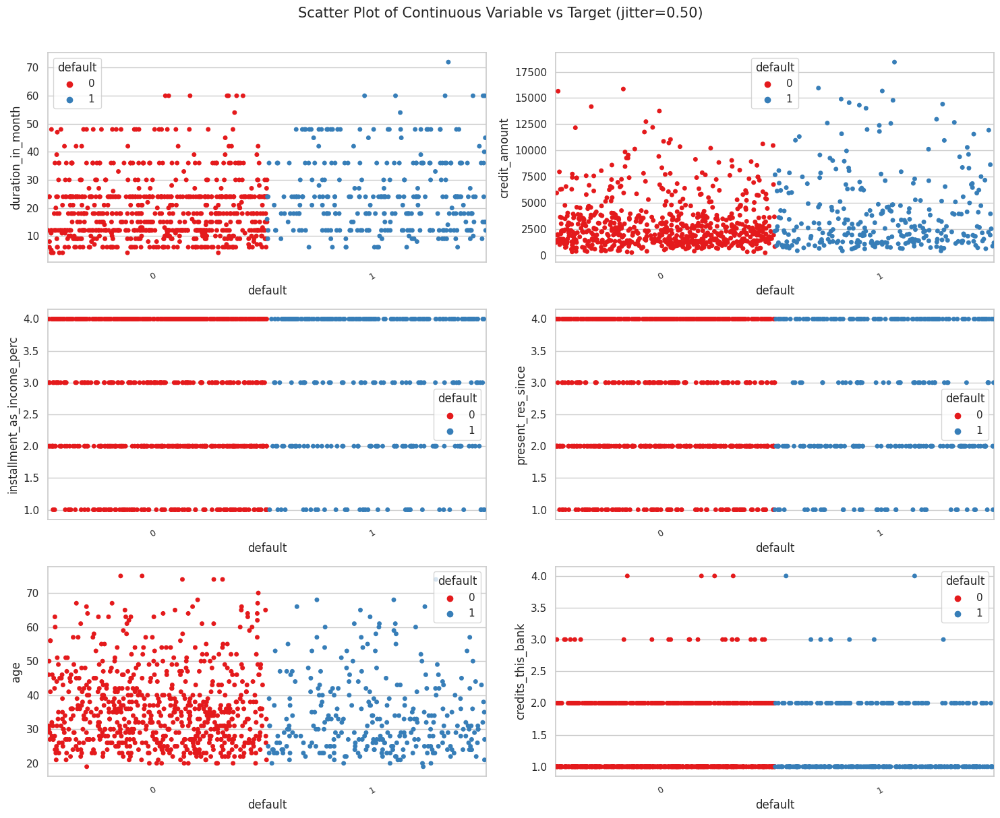

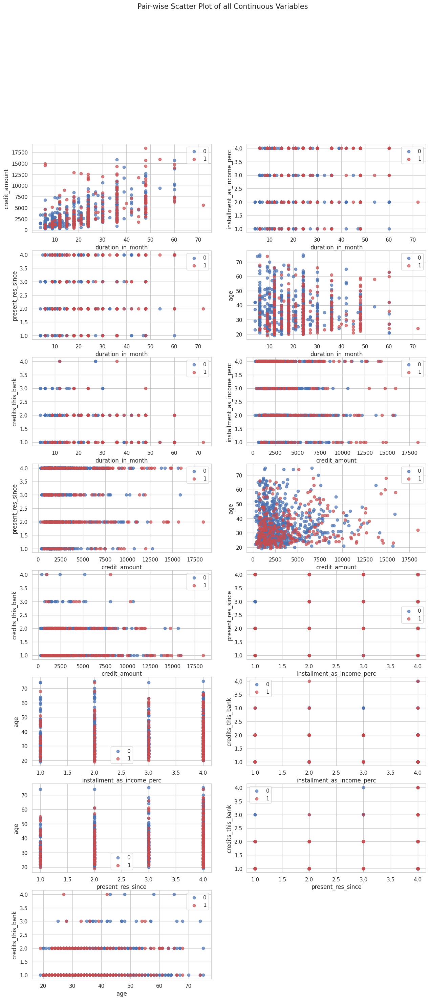

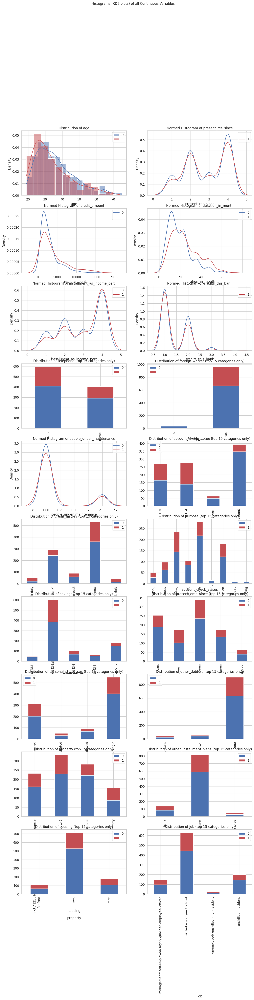

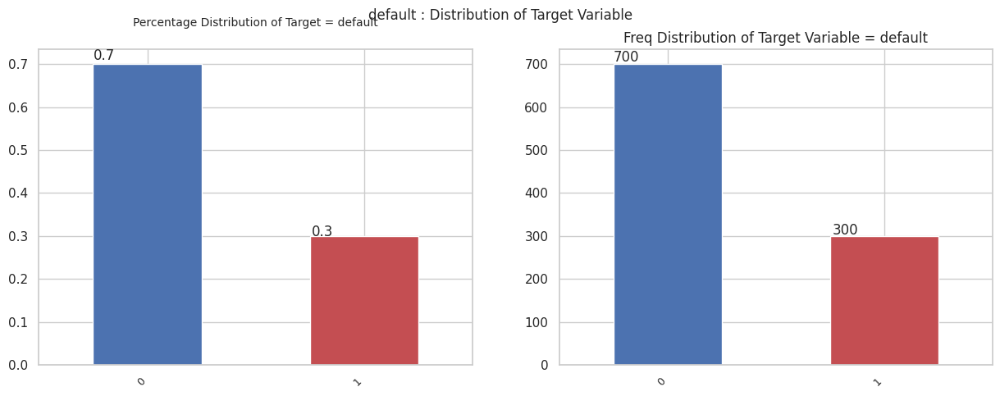

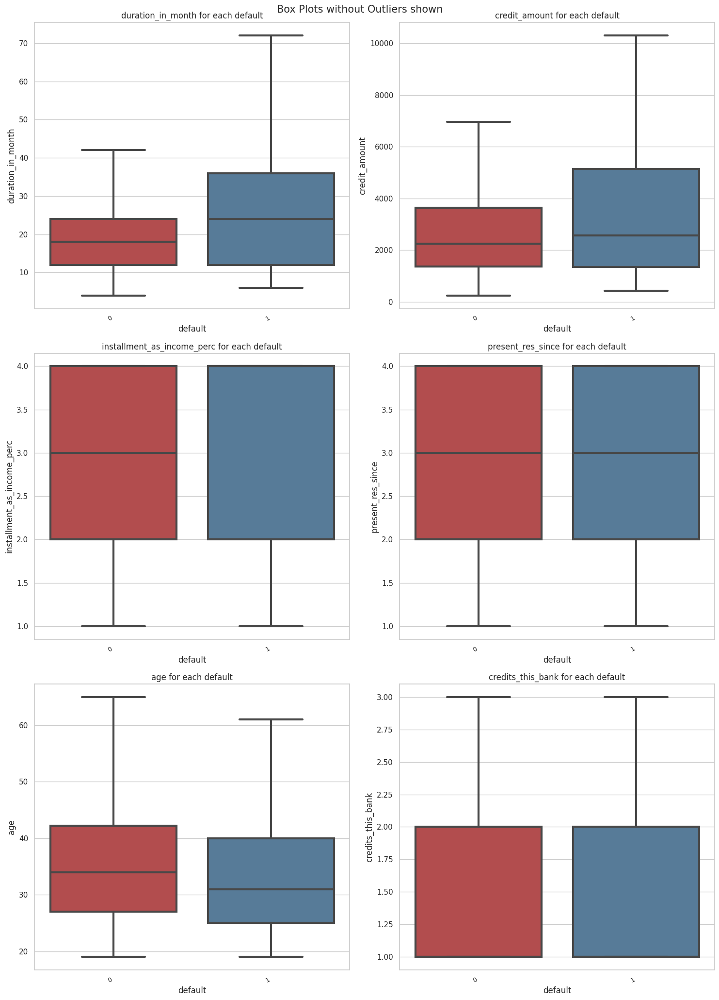

...

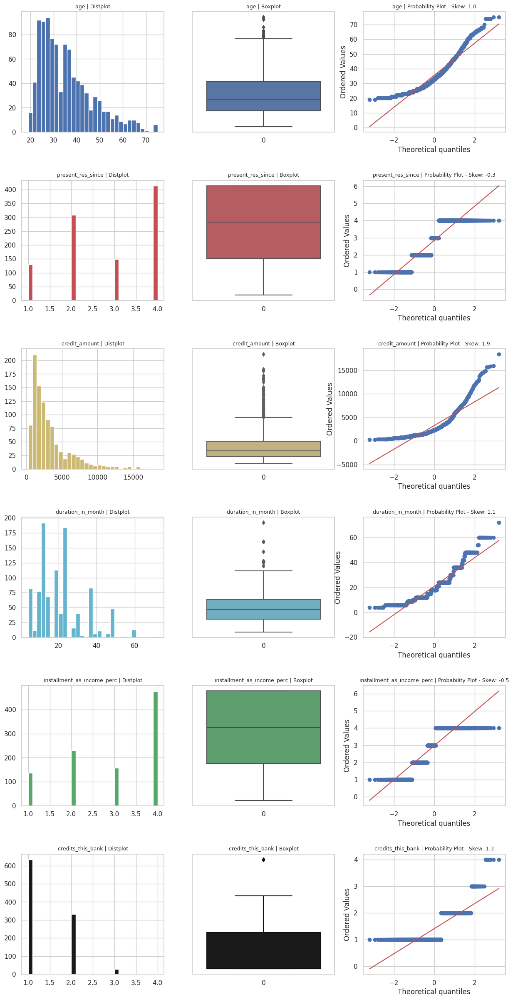

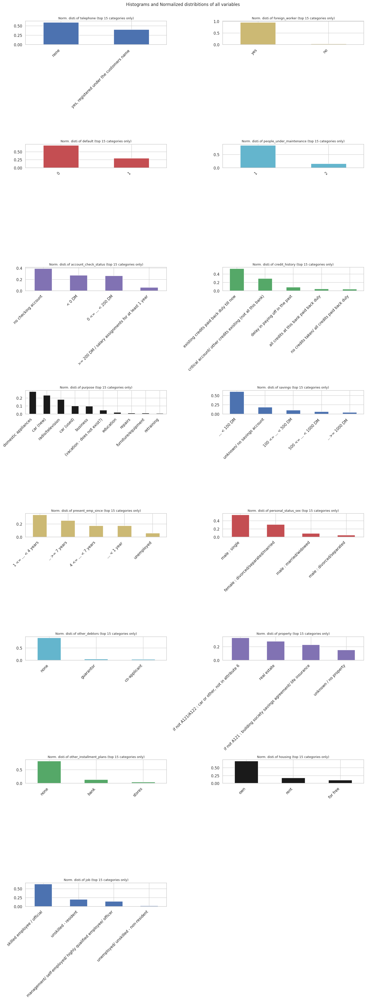

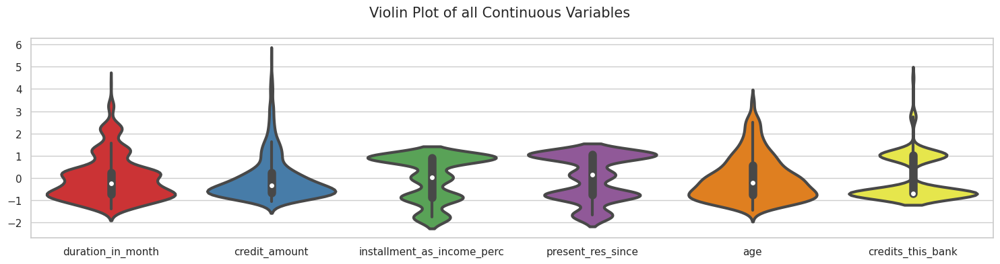

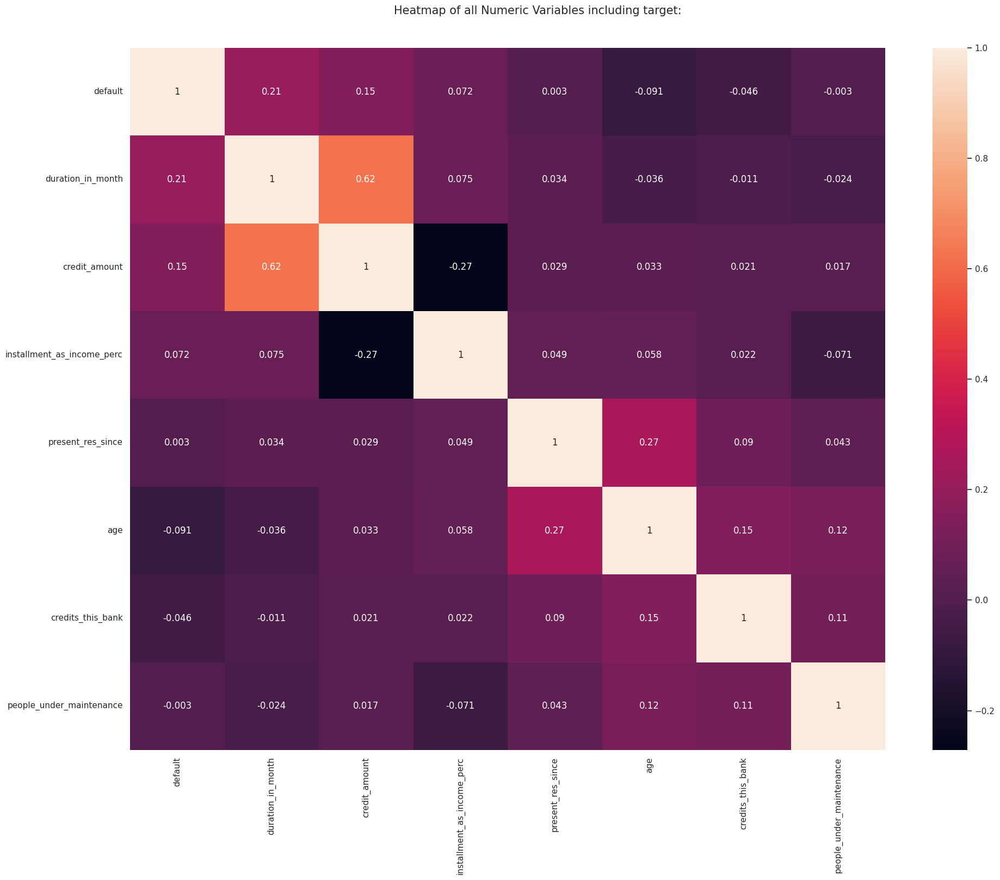

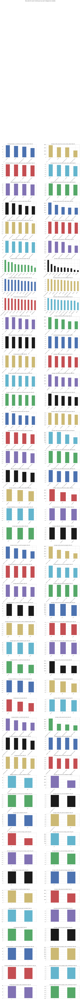

All Plots done
Time to run AutoViz = 67 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [ ]:
#código para procesar dataframe con la herramienta
import pandas as pd
import numpy as np
from autoviz.AutoViz_Class import AutoViz_Class
filename = '/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv'
depVar = 'default'
sep=','
AV = AutoViz_Class()
%matplotlib inline
_ = AV.AutoViz(filename)


###Uso de IA para visualización: "Y-data"

In [ ]:
#carga de paquete
pip install -U ydata-profiling[notebook,unicode,pyspark]


In [ ]:
#Código para ejecutar la herramienta
import pandas as pd
from ydata_profiling import ProfileReport

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/Proyecto_Credit_Scoring_Prediction/german_credit.csv')

In [ ]:
profile = ProfileReport(df, title="Profiling Report")

In [ ]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Análisis complementario para fortalecer el estudio

###PCA-propuesta de algoritmo

In [ ]:
# import pandas as pd
# from sklearn.decomposition import PCA

# # Cargar el conjunto de datos
# df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/banco_EDA.csv')

# # Separar las variables independientes de la variable dependiente
# X = df.iloc[:, :-1].values
# y = df.iloc[:, -1].values

# # Normalizar los datos
# from sklearn.preprocessing import StandardScaler
# X = StandardScaler().fit_transform(X)

# # Crear una instancia de PCA y ajustar los datos
# pca = PCA(n_components=2)
# principalComponents = pca.fit_transform(X)

# # Crear un nuevo dataframe con los componentes principales y la variable dependiente
# principalDf = pd.DataFrame(data = principalComponents, columns = ['componente_principal_1', 'componente_principal_2'])
# finalDf = pd.concat([principalDf, df[['default']]], axis = 1)

# # Visualizar los resultados
# import matplotlib.pyplot as plt
# fig = plt.figure(figsize = (8,8))
# ax = fig.add_subplot(1,1,1)
# ax.set_xlabel('Componente Principal 1', fontsize = 15)
# ax.set_ylabel('Componente Principal 2', fontsize = 15)
# ax.set_title('Análisis de Componentes Principales', fontsize = 20)
# targets = ['clase_1', 'clase_2', 'clase_3']
# colors = ['r', 'g', 'b']
# for target, color in zip(targets,colors):
#     indicesToKeep = finalDf['default'] == target
#     ax.scatter(finalDf.loc[indicesToKeep, 'componente_principal_1']
#                , finalDf.loc[indicesToKeep, 'componente_principal_2']
#                , c = color
#                , s = 50)
# ax.legend(targets)
# ax.grid()
# plt.show()

###Backward Elimination Automatic Implementation-Propuesta de algoritmo

In [ ]:
# import statsmodels.formula.api as sm
# def backwardElimination(x, SL):
#     numVars = len(x[0])
#     temp = np.zeros((50,6)).astype(int)
#     for i in range(0, numVars):
#         regressor_OLS = sm.OLS(y, x).fit()
#         maxVar = max(regressor_OLS.pvalues).astype(float)
#         adjR_before = regressor_OLS.rsquared_adj.astype(float)
#         if maxVar > SL:
#             for j in range(0, numVars - i):
#                 if (regressor_OLS.pvalues[j].astype(float) == maxVar):
#                     temp[:,j] = x[:, j]
#                     x = np.delete(x, j, 1)
#                     tmp_regressor = sm.OLS(y, x).fit()
#                     adjR_after = tmp_regressor.rsquared_adj.astype(float)
#                     if (adjR_before >= adjR_after):
#                         x_rollback = np.hstack((x, temp[:,[0,j]]))
#                         x_rollback = np.delete(x_rollback, j, 1)
#                         print (regressor_OLS.summary())
#                         return x_rollback
#                     else:
#                         continue
#     regressor_OLS.summary()
#     return x

# SL = 0.05
# X_opt = X[:, [0, 1, 2, 3, 4, 5]]
# X_Modeled = backwardElimination(X_opt, SL)